<a href="https://colab.research.google.com/github/bassemr/one-short-learning/blob/main/notebooks/One_shot_learning_with_Cifar100_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# One shot learning with Cifar100 dataset

## 0. Computer vision libraries in PyTorch

* [`torchvision`] - base domain library for PyTorch computer vision
* `torchvision.dataset` - get dataset and data loading functions for computer vision
* `torchvision.models` - get pretrained computer vision models that can leverage for your own problems
* `torchvision.transforms` - function for manipulating your vision data (images) to be suitable for use with an ML model
* `torch.utils.data.Dataset` - Base dataset class for PyTorch.
* `torch.utils.data.DataLoader` - Create a Python iterable over a dataset


In [2]:
# Import PyTorch
import torch
from torch import nn
# Setup training data
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import transforms

# Import torchvision
import torchvision
from torchvision import datasets
from torchvision.transforms import ToTensor

# Import matplotlib for visualization
import matplotlib.pyplot as plt
# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Check versions
# Note: your PyTorch version shouldn't be lower than 1.10.0 and torchvision version shouldn't be lower than 0.11
print(f"PyTorch version: {torch.__version__}\ntorchvision version: {torchvision.__version__}")

[INFO] Couldn't find torchinfo... installing it.
PyTorch version: 2.8.0+cu126
torchvision version: 0.23.0+cu126


## 1. Getting a dataset

The dataset we'll be using is FashionMNIST from torchvision.datasets - https://pytorch.org/vision/stable/generated/torchvision.datasets.CIFAR100.html

In [4]:
# Setup training data
from torchvision import datasets
from torch.utils.data import DataLoader
from torchvision import transforms

train_data = datasets.CIFAR100(
    root='data', # where to download data to?
    train=True, # do we want the training dataset?
    download=True, # do we want to download yes/no
    transform=ToTensor(), # how do we want to transform the data?
    target_transform=None # how do we want to transforms the labels/targets?
)

test_data = datasets.CIFAR100(
    root="data",
    train=False,
    download=True,
    transform=ToTensor(),
    target_transform=None
)

100%|██████████| 169M/169M [00:03<00:00, 43.4MB/s]


In [5]:
# See first training sample
image, label = train_data[0]
image, label

(tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.7647, 0.8314, 0.7137],
          [1.0000, 0.9961, 0.9961,  ..., 0.6667, 0.6314, 0.5725],
          [1.0000, 0.9961, 1.0000,  ..., 0.7412, 0.6510, 0.4745],
          ...,
          [0.5804, 0.5569, 0.5490,  ..., 0.1176, 0.2549, 0.2980],
          [0.4784, 0.4706, 0.4941,  ..., 0.0863, 0.3804, 0.5529],
          [0.3412, 0.3451, 0.3961,  ..., 0.1333, 0.4118, 0.5412]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8784, 0.7608],
          [1.0000, 0.9961, 0.9961,  ..., 0.6902, 0.6588, 0.6039],
          [1.0000, 0.9961, 1.0000,  ..., 0.7804, 0.6980, 0.5216],
          ...,
          [0.7255, 0.7137, 0.7020,  ..., 0.0667, 0.2431, 0.3020],
          [0.6157, 0.6078, 0.6275,  ..., 0.0627, 0.4392, 0.6314],
          [0.4784, 0.4784, 0.5255,  ..., 0.1412, 0.5216, 0.6784]],
 
         [[1.0000, 1.0000, 1.0000,  ..., 0.7569, 0.8000, 0.6549],
          [1.0000, 0.9961, 0.9961,  ..., 0.5882, 0.5098, 0.4431],
          [1.0000, 0.9961, 1.0000,  ...,

### 1.1 Input and output shapes of a computer vision model
We've got a big tensor of values (the image) leading to a single value for the target (the label).

Let's see the image shape.

In [20]:
# What's the shape of the image?
image.shape # [color_channels=3, height=32, width=32]

torch.Size([3, 32, 32])

* Let's check out more shapes of our data.

In [6]:
# How many samples are there?
print(f"train data: {len(train_data.data)}, train target: {len(train_data.targets)}")
print(f"test data: {len(test_data.data)} , test target: {len(test_data.targets)}") #50,000 training samples and 10,000 testing samples.

train data: 50000, train target: 50000
test data: 10000 , test target: 10000


What classes are there?

We can find these via the `.classes` attribute.

In [8]:
# See classes
class_names = train_data.classes
class_names, len(class_names)

(['apple',
  'aquarium_fish',
  'baby',
  'bear',
  'beaver',
  'bed',
  'bee',
  'beetle',
  'bicycle',
  'bottle',
  'bowl',
  'boy',
  'bridge',
  'bus',
  'butterfly',
  'camel',
  'can',
  'castle',
  'caterpillar',
  'cattle',
  'chair',
  'chimpanzee',
  'clock',
  'cloud',
  'cockroach',
  'couch',
  'crab',
  'crocodile',
  'cup',
  'dinosaur',
  'dolphin',
  'elephant',
  'flatfish',
  'forest',
  'fox',
  'girl',
  'hamster',
  'house',
  'kangaroo',
  'keyboard',
  'lamp',
  'lawn_mower',
  'leopard',
  'lion',
  'lizard',
  'lobster',
  'man',
  'maple_tree',
  'motorcycle',
  'mountain',
  'mouse',
  'mushroom',
  'oak_tree',
  'orange',
  'orchid',
  'otter',
  'palm_tree',
  'pear',
  'pickup_truck',
  'pine_tree',
  'plain',
  'plate',
  'poppy',
  'porcupine',
  'possum',
  'rabbit',
  'raccoon',
  'ray',
  'road',
  'rocket',
  'rose',
  'sea',
  'seal',
  'shark',
  'shrew',
  'skunk',
  'skyscraper',
  'snail',
  'snake',
  'spider',
  'squirrel',
  'streetcar',
  

### 1.2 Visualizing our data


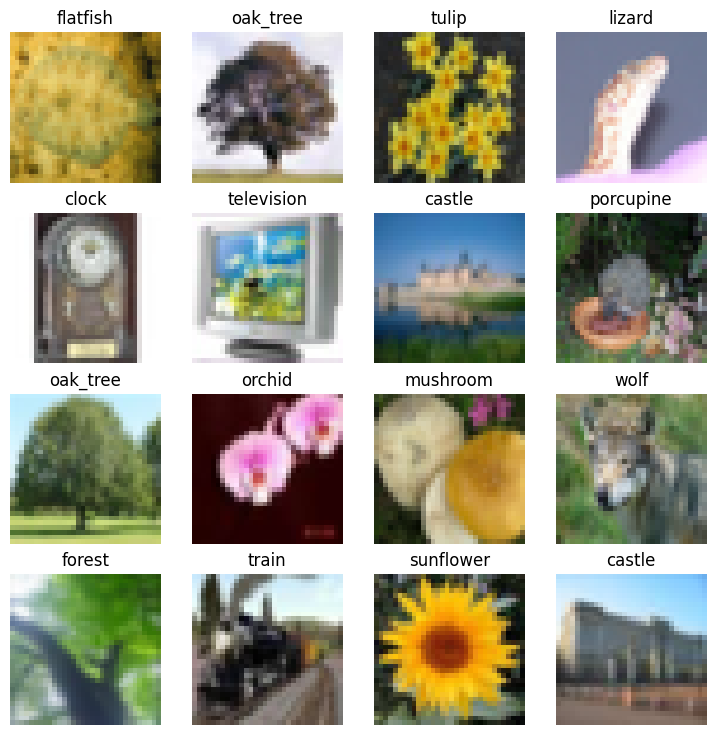

In [9]:
# Plot more images
torch.manual_seed(42)
fig = plt.figure(figsize=(9, 9))
rows, cols = 4, 4
for i in range(1, rows * cols + 1):
    random_idx = torch.randint(0, len(train_data), size=[1]).item()

    img, label = train_data[random_idx]
    fig.add_subplot(rows, cols, i)
    plt.imshow(img.permute(1, 2, 0))  # from (C,H,W) -> (H,W,C)
    plt.axis("off")
    plt.title(class_names[label])

## 2. Preparing our data


### 2.1 get a clone of the project from github




The project link - https://github.com/bassemr/one-short-learning.git

In [2]:
!pwd

/content


In [3]:
def git_project():
  !git clone https://github.com/bassemr/one-short-learning.git
  %cd /content/one-short-learning
def update_git():
  %cd /content/one-short-learning
  !git fetch origin
  !git merge origin/main

In [4]:
git_project()

Cloning into 'one-short-learning'...
remote: Enumerating objects: 165, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 165 (delta 7), reused 7 (delta 3), pack-reused 149 (from 1)
Receiving objects: 100% (165/165), 54.77 MiB | 30.73 MiB/s, done.
Resolving deltas: 100% (82/82), done.
/content/one-short-learning


In [3]:
update_git()

[Errno 2] No such file or directory: '/content/one-short-learning'
/content
fatal: not a git repository (or any of the parent directories): .git
fatal: not a git repository (or any of the parent directories): .git


In [ ]:
import importlib
import data_utils as du
importlib.reload(du)

In [4]:
!pwd
!ls /content/one-short-learning/siamese/

/content/one-short-learning
data_utils.py  helper_functions.py  models.py  test.py	train.py


### 2.2 get the train/valid/test data from `data_utils.py`

In [5]:
# import data.utils.py
import sys
sys.path.append("/content/one-short-learning/siamese") # my python's files are inside siamese folder
from data_utils import prepare_data

`prepare_data(root,
            num_training_classes,
            pos_num_pairs
            neg_num_pairs,
            batch_size,
            img_size=224)`

Prepare data loaders and few-shot test dataset for CIFAR-100.

Steps:
* Load the full CIFAR-100 dataset (train + test combined).
* Split dataset into seen (training) and unseen (test) classes.
* Apply transformations to unseen/test dataset.
* Generate positive and negative pairs from seen classes for Siamese training.
* Split pairs into training and validation loaders.
* Prepare few-shot test dataset from unseen classes.

Args:
* root (str): Path to CIFAR-100 data folder.
* num_training_classes (int): Number of seen classes used for training.
* pos_num_pairs (int): Number of positive pairs per class for training.
* neg_num_pairs (int): Number of negative pairs per class for training.
* batch_size (int): Batch size for training and validation loaders.
* img_size (int, optional): Size to which images are resized. Defaults to 224.

Returns:
* train_loader (DataLoader): Training loader with positive/negative pairs.
* valid_loader (DataLoader): Validation loader.
* test_data (Dataset): Few-shot test dataset from unseen classes.
    

In [5]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 300
neg_num_pairs = 300
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


100%|██████████| 169M/169M [00:14<00:00, 11.5MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 53979
[INFO] Number of batches - Train: 760, Validation: 85
Support: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query: torch.Size([5990, 3, 224, 224]) torch.Size([5990])


In [6]:
for support_imgs, support_lbls in support_loader:
    print("Support batch:", support_imgs.shape, support_lbls.shape)

for query_imgs, query_lbls in query_loader:
    print("Query batch:", query_imgs.shape, query_lbls.shape)
    break
len(support_loader), len(query_loader)

Support batch: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query batch: torch.Size([128, 3, 224, 224]) torch.Size([128])


(1, 47)

### 2.3 Visualize pairs

In [101]:
from helper_functions import visualize_pairs

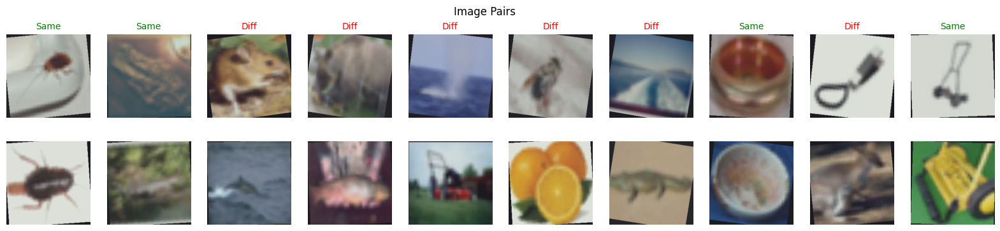

In [8]:
visualize_pairs(train_loader, n=10)

## 3. Create Siamese Network (ResNet18)

Project Goal
We are not trying to classify an image into its class.
Instead, our task is to determine whether two images are similar or not.

**Model Requirements** :

* Input: a pair of images.

* Output: a single value representing their similarity (e.g., how close or different they are).

### 3.1 Import Our Model


In [6]:
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
net = SiameseResNet(embedding_size=128).to(device)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 234MB/s]


In [7]:
# freeze the model until layer 4
net.freeze_until(4)

# show model's summary
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

## 4. Train the model

###4.1 First Experiment
* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 90
* Number of pairs per class: 300 positive + 300 negative
* Total pairs generated for training: 53979
* Number of epochs: 30
* Early stopping patience: 10

In [9]:
# Import train and create_writer
from train import train, create_writer

In [9]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 30
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="30_epochs_300_paris"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-04/cifar100_seen90/siamese_resnet18/30_epochs_300_paris...


Training:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch [1/30] --> Train Loss: 0.6261, Train Acc: 0.6415 | Val Loss: 0.7223, Val Acc: 0.5714
  ✅ New best model saved
Epoch [2/30] --> Train Loss: 0.5758, Train Acc: 0.6955 | Val Loss: 0.6342, Val Acc: 0.6489
  ✅ New best model saved
Epoch [3/30] --> Train Loss: 0.5513, Train Acc: 0.7176 | Val Loss: 0.5866, Val Acc: 0.7006
  ✅ New best model saved
Epoch [4/30] --> Train Loss: 0.5310, Train Acc: 0.7339 | Val Loss: 0.5528, Val Acc: 0.7297
  ✅ New best model saved
Epoch [5/30] --> Train Loss: 0.5170, Train Acc: 0.7478 | Val Loss: 0.5097, Val Acc: 0.7617
  ✅ New best model saved
Epoch [6/30] --> Train Loss: 0.4994, Train Acc: 0.7598 | Val Loss: 0.5181, Val Acc: 0.7626
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [7/30] --> Train Loss: 0.4889, Train Acc: 0.7684 | Val Loss: 0.4944, Val Acc: 0.7741
  ✅ New best model saved
Epoch [8/30] --> Train Loss: 0.4715, Train Acc: 0.7788 | Val Loss: 0.4720, Val Acc: 0.7875
  ✅ New best model saved
Epoch [9/30] --> Train Loss: 0.4565, Train Acc: 0.7

In [77]:
# Viewing TensorBoard in Jupyter and Google Colab Notebooks (uncomment to view full TensorBoard instance)
%load_ext tensorboard
%tensorboard --logdir /content/one-short-learning/runs

<IPython.core.display.Javascript object>

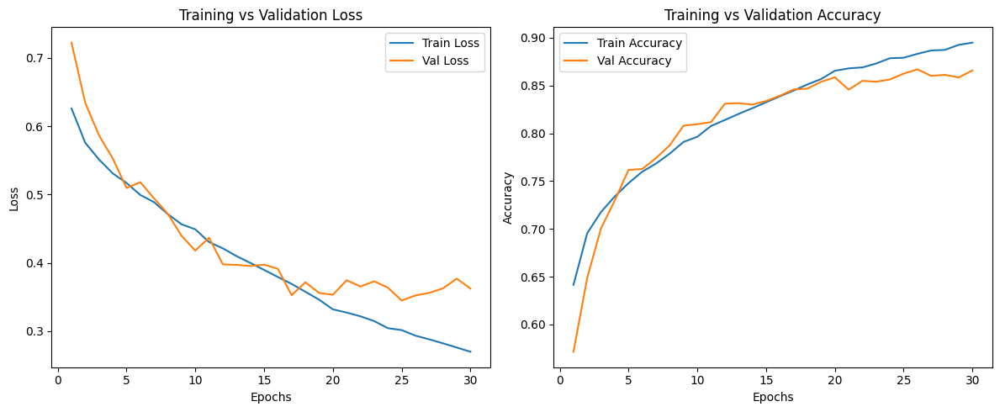

In [10]:
from helper_functions import plot_history
plot_history(history)

In [11]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelResnet18_v2_25_epochs_400_paris_10p.pth")
# Download the saved model file
files.download("models/modelResnet18_v2_25_epochs_400_paris_10p.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelResnet18_v2_25_epochs_400_paris_10p.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Loss_val/events.out.tfevents.1759392997.73b5972d8485.2172.2 (deflated 42%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Accuracy_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-02/cifar100_seen90/siamese_resnet18/30_epochs_300_paris/Accuracy_val/events.out.tfevents

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

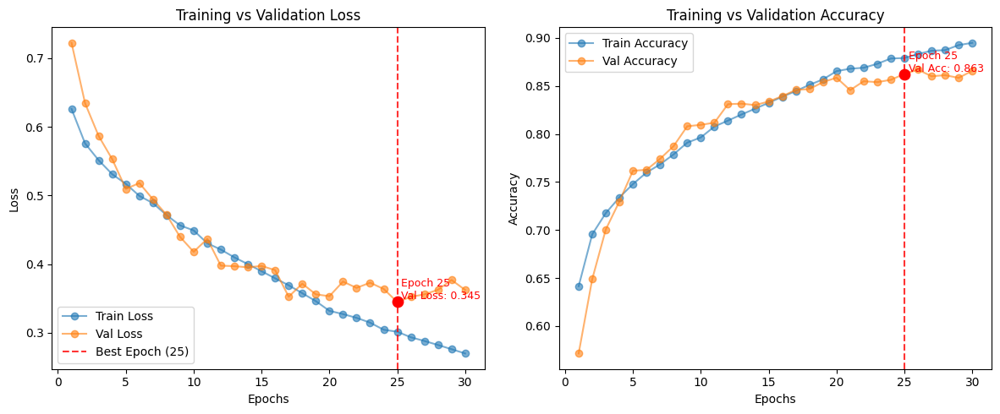

In [14]:
import matplotlib.pyplot as plt
import numpy as np

def plot_history(history):
    epochs = np.arange(1, len(history["train_loss"]) + 1)

    # Find the best epoch (lowest val loss)
    best_epoch = np.argmin(history["val_loss"]) + 1
    best_val_loss = history["val_loss"][best_epoch - 1]
    best_val_acc = history["val_acc"][best_epoch - 1]

    plt.figure(figsize=(12, 5))

    # -----------------------------
    # Plot Loss
    # -----------------------------
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Train Loss", marker='o', alpha=0.6)
    plt.plot(epochs, history["val_loss"], label="Val Loss", marker='o', alpha=0.6)
    plt.axvline(best_epoch, color="red", linestyle="--", alpha=0.8, label=f"Best Epoch ({best_epoch})")
    plt.scatter(best_epoch, best_val_loss, color="red", s=80, zorder=5)
    plt.text(best_epoch + 0.3, best_val_loss, f"Epoch {best_epoch}\nVal Loss: {best_val_loss:.3f}",
             color="red", fontsize=9, verticalalignment="bottom")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Loss")
    plt.legend()

    # -----------------------------
    # Plot Accuracy
    # -----------------------------
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy", marker='o', alpha=0.6)
    plt.plot(epochs, history["val_acc"], label="Val Accuracy", marker='o', alpha=0.6)
    plt.axvline(best_epoch, color="red", linestyle="--", alpha=0.8)
    plt.scatter(best_epoch, best_val_acc, color="red", s=80, zorder=5)
    plt.text(best_epoch + 0.3, best_val_acc, f"Epoch {best_epoch}\nVal Acc: {best_val_acc:.3f}",
             color="red", fontsize=9, verticalalignment="bottom")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Training vs Validation Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()
plot_history(history)


In [13]:
import torch
import torch.nn.functional as F

def evaluate_fewshot(model, support_loader, query_loader, device="cuda", batch_size=512):
    """
    Evaluate a Siamese network on a 1-shot N-way task.

    Args:
        model: SiameseResNet (outputs logits)
        support_loader: DataLoader with support set (1 per class)
        query_loader: DataLoader with queries
        device: "cuda" or "cpu"
        batch_size: chunk size for processing query-support pairs

    Returns:
        accuracy (float)
    """
    model.eval()
    total_correct, total_samples = 0, 0

    # Load support set (tiny, so just take all)
    support_images, support_labels = next(iter(support_loader))
    support_images, support_labels = support_images.to(device), support_labels.to(device)
    K = support_images.size(0)  # number of classes

    with torch.no_grad():
        for query_images, query_labels in query_loader:
            query_images, query_labels = query_images.to(device), query_labels.to(device)
            Q = query_images.size(0)

            # Expand into Q*K pairs
            q_expanded = query_images.unsqueeze(1).expand(-1, K, -1, -1, -1)
            s_expanded = support_images.unsqueeze(0).expand(Q, -1, -1, -1, -1)

            q_flat = q_expanded.reshape(Q*K, *query_images.shape[1:])
            s_flat = s_expanded.reshape(Q*K, *support_images.shape[1:])

            # Process in chunks to avoid OOM
            probs_list = []
            for start in range(0, Q*K, batch_size):
                end = min(start + batch_size, Q*K)
                logits = model(q_flat[start:end], s_flat[start:end])  # [chunk, 1]
                probs = torch.sigmoid(logits).view(-1)
                probs_list.append(probs.detach().cpu())

            # Combine and reshape to [Q, K]
            probs = torch.cat(probs_list).view(Q, K)

            # Pick best support class
            best_idx = torch.argmax(probs, dim=1)   # [Q]
            pred_labels = support_labels[best_idx]

            # Update accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    acc = total_correct / total_samples
    print(f"[RESULT] Few-shot accuracy: {acc:.4f}")
    return acc
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.3693


### 4.2 Second Experiment
* Model: Resnet18  + BCEWithLogits
* Image Size: 224 (original)
* Seen classes: 90
* Number of pairs per class: 100 positive + 100 negative
* Total pairs generated for training: 17_998
* Number of epochs: 50
* Early stopping patience: 10

In [71]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 100
neg_num_pairs = 100
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size
)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 17998
[INFO] Number of batches - Train: 254, Validation: 29
Support: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query: torch.Size([5990, 3, 224, 224]) torch.Size([5990])


In [ ]:
net = SiameseResNet(embedding_size=128).to(device)


In [73]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 50
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="siamese_resnet18",
    extra="50_epochs_100_paris_10p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/50_epochs_400_paris_10p...


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50] --> Train Loss: 0.6658, Train Acc: 0.5907 | Val Loss: 0.6566, Val Acc: 0.6014
  ✅ New best model saved
Epoch [2/50] --> Train Loss: 0.6315, Train Acc: 0.6365 | Val Loss: 0.6388, Val Acc: 0.6404
  ✅ New best model saved
Epoch [3/50] --> Train Loss: 0.6134, Train Acc: 0.6617 | Val Loss: 0.6659, Val Acc: 0.6248
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [4/50] --> Train Loss: 0.6044, Train Acc: 0.6644 | Val Loss: 0.6293, Val Acc: 0.6387
  ✅ New best model saved
Epoch [5/50] --> Train Loss: 0.5903, Train Acc: 0.6806 | Val Loss: 0.6023, Val Acc: 0.6565
  ✅ New best model saved
Epoch [6/50] --> Train Loss: 0.5844, Train Acc: 0.6868 | Val Loss: 0.6212, Val Acc: 0.6604
  ⚠️ No improvement. Early stop counter: 1/10
Epoch [7/50] --> Train Loss: 0.5714, Train Acc: 0.6986 | Val Loss: 0.6100, Val Acc: 0.6882
  ⚠️ No improvement. Early stop counter: 2/10
Epoch [8/50] --> Train Loss: 0.5637, Train Acc: 0.7058 | Val Loss: 0.5919, Val Acc: 0.6826
  ✅ New best model saved
Epoch [9/

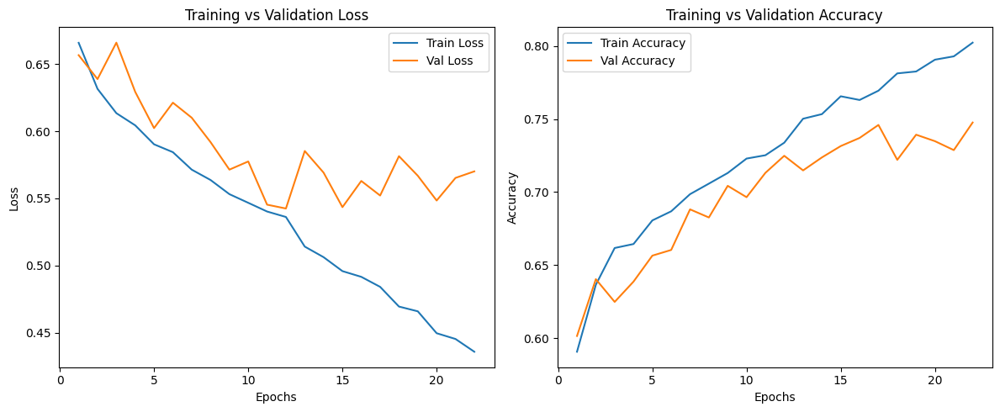

In [74]:
from helper_functions import plot_history
plot_history(history)

In [76]:
import torch
import torch.nn.functional as F

def evaluate_fewshot(model, support_loader, query_loader, device="cuda", batch_size=512):
    """
    Evaluate a Siamese network on a 1-shot N-way task.

    Args:
        model: SiameseResNet (outputs logits)
        support_loader: DataLoader with support set (1 per class)
        query_loader: DataLoader with queries
        device: "cuda" or "cpu"
        batch_size: chunk size for processing query-support pairs

    Returns:
        accuracy (float)
    """
    model.eval()
    total_correct, total_samples = 0, 0

    # Load support set (tiny, so just take all)
    support_images, support_labels = next(iter(support_loader))
    support_images, support_labels = support_images.to(device), support_labels.to(device)
    K = support_images.size(0)  # number of classes

    with torch.no_grad():
        for query_images, query_labels in query_loader:
            query_images, query_labels = query_images.to(device), query_labels.to(device)
            Q = query_images.size(0)

            # Expand into Q*K pairs
            q_expanded = query_images.unsqueeze(1).expand(-1, K, -1, -1, -1)
            s_expanded = support_images.unsqueeze(0).expand(Q, -1, -1, -1, -1)

            q_flat = q_expanded.reshape(Q*K, *query_images.shape[1:])
            s_flat = s_expanded.reshape(Q*K, *support_images.shape[1:])

            # Process in chunks to avoid OOM
            probs_list = []
            for start in range(0, Q*K, batch_size):
                end = min(start + batch_size, Q*K)
                logits = model(q_flat[start:end], s_flat[start:end])  # [chunk, 1]
                probs = torch.sigmoid(logits).view(-1)
                probs_list.append(probs.detach().cpu())

            # Combine and reshape to [Q, K]
            probs = torch.cat(probs_list).view(Q, K)

            # Pick best support class
            best_idx = torch.argmax(probs, dim=1)   # [Q]
            pred_labels = support_labels[best_idx]

            # Update accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    acc = total_correct / total_samples
    print(f"[RESULT] Few-shot accuracy: {acc:.4f}")
    return acc
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.3888


In [43]:
from tqdm import tqdm


In [75]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelv2_100pairs_l4.pth")
# Download the saved model file
files.download("models/modelv2_100pairs_l4.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelv2_100pairs_l4.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/events.out.tfevents.1759489314.069e36433463.2869.32 (deflated 12%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_va

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 4.3 third experiment with CNN

In [89]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 400
neg_num_pairs = 400
batch_size = 64
img_size = 32

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 71956
[INFO] Number of batches - Train: 1012, Validation: 113
Support: torch.Size([10, 3, 32, 32]) torch.Size([10])
Query: torch.Size([5990, 3, 32, 32]) torch.Size([5990])


In [79]:
import torch
import torch.nn as nn

# -------------------------------
# CNN Encoder for 32x32 images
# -------------------------------
class CNNEncoder(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.conv = nn.Sequential(
            # Input: 3x32x32
            nn.Conv2d(3, 64, kernel_size=5, stride=1, padding=2),  # -> 64x32x32
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),  # -> 64x16x16

            nn.Conv2d(64, 128, kernel_size=5, stride=1, padding=2), # -> 128x16x16
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),  # -> 128x8x8

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1), # -> 256x8x8
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(2)  # -> 256x4x4
        )

        self.fc = nn.Sequential(
            nn.Linear(256*4*4, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, embedding_dim)  # -> final embedding
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)  # flatten
        x = self.fc(x)
        return x


# -------------------------------
# Siamese Network
# -------------------------------
class SiameseCNN(nn.Module):
    def __init__(self, embedding_dim=128):
        super().__init__()
        self.encoder = CNNEncoder(embedding_dim)
        self.classifier = nn.Linear(embedding_dim, 1)  # single logit for BCE

    def forward_once(self, x):
        return self.encoder(x)

    def forward(self, x1, x2):
        e1 = self.forward_once(x1)
        e2 = self.forward_once(x2)

        diff = torch.abs(e1 - e2)
        out = self.classifier(diff)  # logits for BCEWithLogitsLoss
        return out


In [87]:
model = SiameseCNN(embedding_dim=128).to(device)
summary(model,
              [(1, 3, 32, 32), (1, 3, 32, 32)],  # two inputs
        verbose=0,
                col_names=["input_size", "output_size", "num_params", "trainable"],
                col_width=20,
                row_settings=["var_names"])


Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
SiameseCNN (SiameseCNN)                  [1, 3, 32, 32]       [1, 1]               --                   True
├─CNNEncoder (encoder)                   [1, 3, 32, 32]       [1, 128]             --                   True
│    └─Sequential (conv)                 [1, 3, 32, 32]       [1, 256, 4, 4]       --                   True
│    │    └─Conv2d (0)                   [1, 3, 32, 32]       [1, 64, 32, 32]      4,864                True
│    │    └─BatchNorm2d (1)              [1, 64, 32, 32]      [1, 64, 32, 32]      128                  True
│    │    └─ReLU (2)                     [1, 64, 32, 32]      [1, 64, 32, 32]      --                   --
│    │    └─MaxPool2d (3)                [1, 64, 32, 32]      [1, 64, 16, 16]      --                   --
│    │    └─Conv2d (4)                   [1, 64, 16, 16]      [1, 128, 16, 16]     204,928              True
│    │    └─BatchN

In [90]:
%%time
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)

epochs = 100
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen90",
    model_name="CNN",
    extra="100_epochs_400_paris_15p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=15,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-03/cifar100_seen90/CNN/100_epochs_400_paris_15p...


Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch [1/100] --> Train Loss: 0.6564, Train Acc: 0.6098 | Val Loss: 0.7106, Val Acc: 0.6204
  ✅ New best model saved
Epoch [2/100] --> Train Loss: 0.6486, Train Acc: 0.6212 | Val Loss: 0.7068, Val Acc: 0.6279
  ✅ New best model saved
Epoch [3/100] --> Train Loss: 0.6418, Train Acc: 0.6278 | Val Loss: 0.6230, Val Acc: 0.6642
  ✅ New best model saved
Epoch [4/100] --> Train Loss: 0.6347, Train Acc: 0.6392 | Val Loss: 0.6232, Val Acc: 0.6543
  ⚠️ No improvement. Early stop counter: 1/15
Epoch [5/100] --> Train Loss: 0.6313, Train Acc: 0.6421 | Val Loss: 0.6215, Val Acc: 0.6698
  ✅ New best model saved
Epoch [6/100] --> Train Loss: 0.6256, Train Acc: 0.6491 | Val Loss: 0.5939, Val Acc: 0.6841
  ✅ New best model saved
Epoch [7/100] --> Train Loss: 0.6192, Train Acc: 0.6561 | Val Loss: 0.6102, Val Acc: 0.6726
  ⚠️ No improvement. Early stop counter: 1/15
Epoch [8/100] --> Train Loss: 0.6180, Train Acc: 0.6541 | Val Loss: 0.6120, Val Acc: 0.6695
  ⚠️ No improvement. Early stop counter: 2/15
E

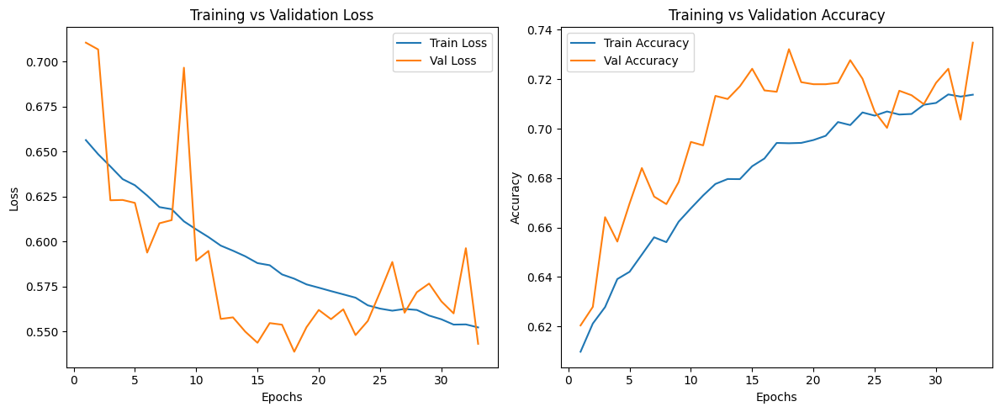

In [91]:
plot_history(history)

In [92]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "model_CNN_400pairs_15.pth")
# Download the saved model file
files.download("models/model_CNN_400pairs_15.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/model_CNN_400pairs_15.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

updating: content/one-short-learning/runs/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Accuracy_val/events.out.tfevents.1759489314.069e36433463.2869.32 (deflated 12%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_val/ (stored 0%)
updating: content/one-short-learning/runs/2025-10-03/cifar100_seen90/siamese_resnet18/30_epochs_300_paris_10p/Loss_va

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [93]:
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.2710


### 4.4 fourth experiment

In [6]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 50
pos_num_pairs = 300
neg_num_pairs = 300
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


100%|██████████| 169M/169M [00:13<00:00, 12.2MB/s]


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 30000
[INFO] Unseen dataset size: 30000
[INFO] Test dataset (unseen classes) size: 30000
[INFO] Total pairs generated for training: 29994
[INFO] Number of batches - Train: 422, Validation: 47
Support: torch.Size([50, 3, 224, 224]) torch.Size([50])
Query: torch.Size([29950, 3, 224, 224]) torch.Size([29950])


In [14]:
net = SiameseResNet(embedding_size=128).to(device)
# Unfreeze last block of ResNet (layer4)
net.freeze_until(4)


# freeze the model until layer 4
#net.freeze_until(3)
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

In [17]:
%%time


# show model's summary
#net.summary(input_size=(64, 3, 224, 224), verbose=0)
criterion = torch.nn.BCEWithLogitsLoss()
#optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
# Optimizer only for trainable parameters
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, net.parameters()),
    lr=1e-5,          # fine-tuning LR
    weight_decay=1e-4
)

epochs = 50
writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen50",
    model_name="siamese_resnet18",
    extra="50_epochs_300_paris_10p"
)

history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-04/cifar100_seen50/siamese_resnet18/50_epochs_300_paris_10p...


Training:   0%|          | 0/50 [00:00<?, ?it/s]

Epoch [1/50] --> Train Loss: 0.6906, Train Acc: 0.5314 | Val Loss: 0.6718, Val Acc: 0.6039
  ✅ New best model saved
Epoch [2/50] --> Train Loss: 0.6650, Train Acc: 0.5998 | Val Loss: 0.6387, Val Acc: 0.6596
  ✅ New best model saved
Epoch [3/50] --> Train Loss: 0.6372, Train Acc: 0.6439 | Val Loss: 0.6067, Val Acc: 0.6822
  ✅ New best model saved
Epoch [4/50] --> Train Loss: 0.6126, Train Acc: 0.6712 | Val Loss: 0.5836, Val Acc: 0.6922
  ✅ New best model saved
Epoch [5/50] --> Train Loss: 0.5935, Train Acc: 0.6911 | Val Loss: 0.5674, Val Acc: 0.6926
  ✅ New best model saved
Epoch [6/50] --> Train Loss: 0.5723, Train Acc: 0.7148 | Val Loss: 0.5623, Val Acc: 0.6856
  ✅ New best model saved
Epoch [7/50] --> Train Loss: 0.5529, Train Acc: 0.7272 | Val Loss: 0.5577, Val Acc: 0.6812
  ✅ New best model saved
Epoch [8/50] --> Train Loss: 0.5408, Train Acc: 0.7324 | Val Loss: 0.5549, Val Acc: 0.6836
  ✅ New best model saved
Epoch [9/50] --> Train Loss: 0.5239, Train Acc: 0.7491 | Val Loss: 0.556

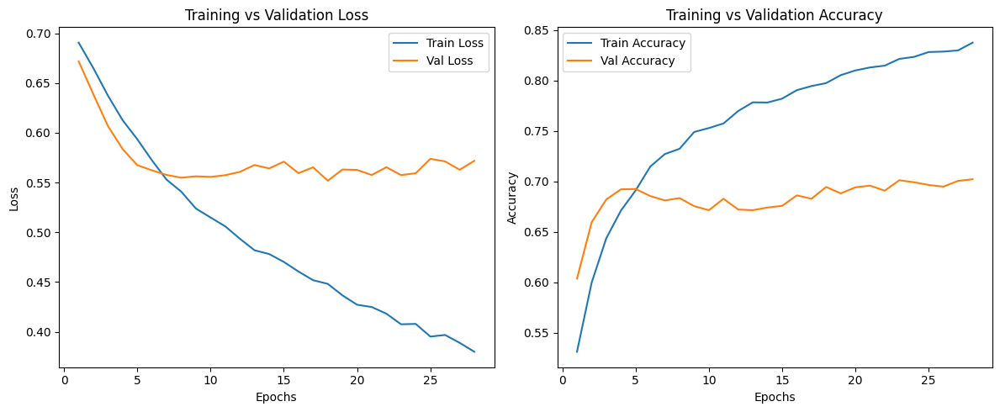

In [19]:
from helper_functions import plot_history

plot_history(history)

In [22]:
import torch
import torch.nn.functional as F

def evaluate_fewshot(model, support_loader, query_loader, device="cuda", batch_size=512):
    """
    Evaluate a Siamese network on a 1-shot N-way task.

    Args:
        model: SiameseResNet (outputs logits)
        support_loader: DataLoader with support set (1 per class)
        query_loader: DataLoader with queries
        device: "cuda" or "cpu"
        batch_size: chunk size for processing query-support pairs

    Returns:
        accuracy (float)
    """
    model.eval()
    total_correct, total_samples = 0, 0

    # Load support set (tiny, so just take all)
    support_images, support_labels = next(iter(support_loader))
    support_images, support_labels = support_images.to(device), support_labels.to(device)
    K = support_images.size(0)  # number of classes

    with torch.no_grad():
        for query_images, query_labels in query_loader:
            query_images, query_labels = query_images.to(device), query_labels.to(device)
            Q = query_images.size(0)

            # Expand into Q*K pairs
            q_expanded = query_images.unsqueeze(1).expand(-1, K, -1, -1, -1)
            s_expanded = support_images.unsqueeze(0).expand(Q, -1, -1, -1, -1)

            q_flat = q_expanded.reshape(Q*K, *query_images.shape[1:])
            s_flat = s_expanded.reshape(Q*K, *support_images.shape[1:])

            # Process in chunks to avoid OOM
            probs_list = []
            for start in range(0, Q*K, batch_size):
                end = min(start + batch_size, Q*K)
                logits = model(q_flat[start:end], s_flat[start:end])  # [chunk, 1]
                probs = torch.sigmoid(logits).view(-1)
                probs_list.append(probs.detach().cpu())

            # Combine and reshape to [Q, K]
            probs = torch.cat(probs_list).view(Q, K)

            # Pick best support class
            best_idx = torch.argmax(probs, dim=1)   # [Q]
            pred_labels = support_labels[best_idx]

            # Update accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    acc = total_correct / total_samples
    print(f"[RESULT] Few-shot accuracy: {acc:.4f}")
    return acc
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=512)


OutOfMemoryError: CUDA out of memory. Tried to allocate 3.59 GiB. GPU 0 has a total capacity of 22.16 GiB of which 1.77 GiB is free. Process 13138 has 20.39 GiB memory in use. Of the allocated memory 17.29 GiB is allocated by PyTorch, and 2.86 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

### 4.5 fifth Experiment

* Model: Resnet18 + BCEWithLogits
* Image Size: 224
* Seen classes: 80
* Number of pairs per class: 350 positive + 350 negative
* Total pairs generated for training: 55970
* Number of epochs: 30
* Early stopping patience: 10

In [16]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 350
neg_num_pairs = 350
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 55970
[INFO] Number of batches - Train: 788, Validation: 88
Support: torch.Size([20, 3, 224, 224]) torch.Size([20])
Query: torch.Size([11980, 3, 224, 224]) torch.Size([11980])


In [7]:
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [17]:
net = SiameseResNet(embedding_size=128).to(device)
# freeze the model until layer 4
net.freeze_until(4)
net.summary(input_size=(64, 3, 224, 224), verbose=0)

Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
SiameseResNet (SiameseResNet)                 [64, 3, 224, 224]    [64, 1]              513,000              Partial
├─Sequential (encoder)                        [64, 3, 224, 224]    [64, 512, 1, 1]      --                   Partial
│    └─Conv2d (0)                             [64, 3, 224, 224]    [64, 64, 112, 112]   (9,408)              False
│    └─BatchNorm2d (1)                        [64, 64, 112, 112]   [64, 64, 112, 112]   (128)                False
│    └─ReLU (2)                               [64, 64, 112, 112]   [64, 64, 112, 112]   --                   --
│    └─MaxPool2d (3)                          [64, 64, 112, 112]   [64, 64, 56, 56]     --                   --
│    └─Sequential (4)                         [64, 64, 56, 56]     [64, 64, 56, 56]     --                   False
│    │    └─BasicBlock (0)                    [64, 64, 56, 56]     [64, 64, 56

In [10]:
from train import ContrastiveLoss, compute_pair_accuracy

In [18]:
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = torch.nn.BCEWithLogitsLoss()

writer = create_writer(
    log_dir="/content/one-short-learning/runs",
    experiment_name="cifar100_seen80",
    model_name="siamese_resnet18",
    extra="30_epochs_350_paris_10p"
)
epochs = 30
history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=writer
)

[INFO] Created SummaryWriter, saving to: /content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p...


Training:   0%|          | 0/30 [00:00<?, ?it/s]

Epoch [1/30] --> Train Loss: 0.6313, Train Acc: 0.6326 | Val Loss: 0.6023, Val Acc: 0.6509
  ✅ New best model saved
Epoch [2/30] --> Train Loss: 0.5826, Train Acc: 0.6886 | Val Loss: 0.5422, Val Acc: 0.7247
  ✅ New best model saved
Epoch [3/30] --> Train Loss: 0.5565, Train Acc: 0.7143 | Val Loss: 0.4982, Val Acc: 0.7595
  ✅ New best model saved
Epoch [4/30] --> Train Loss: 0.5346, Train Acc: 0.7326 | Val Loss: 0.4924, Val Acc: 0.7609
  ✅ New best model saved
Epoch [5/30] --> Train Loss: 0.5153, Train Acc: 0.7450 | Val Loss: 0.4853, Val Acc: 0.7676
  ✅ New best model saved
Epoch [6/30] --> Train Loss: 0.5018, Train Acc: 0.7579 | Val Loss: 0.4509, Val Acc: 0.7902
  ✅ New best model saved
Epoch [7/30] --> Train Loss: 0.4890, Train Acc: 0.7671 | Val Loss: 0.4355, Val Acc: 0.8003
  ✅ New best model saved
Epoch [8/30] --> Train Loss: 0.4752, Train Acc: 0.7795 | Val Loss: 0.4186, Val Acc: 0.8138
  ✅ New best model saved
Epoch [9/30] --> Train Loss: 0.4594, Train Acc: 0.7885 | Val Loss: 0.402

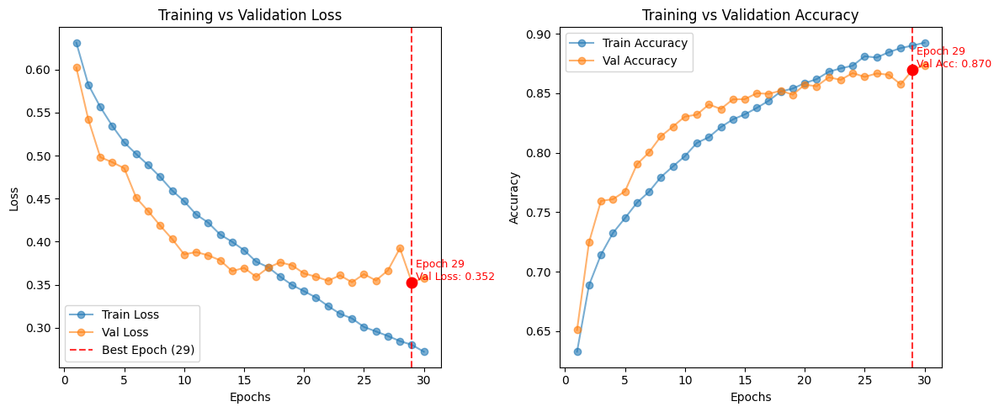

In [19]:
import matplotlib.pyplot as plt
import numpy as np

def plot_history(history):
    epochs = np.arange(1, len(history["train_loss"]) + 1)

    # Find the best epoch (lowest val loss)
    best_epoch = np.argmin(history["val_loss"]) + 1
    best_val_loss = history["val_loss"][best_epoch - 1]
    best_val_acc = history["val_acc"][best_epoch - 1]

    plt.figure(figsize=(12, 5))

    # -----------------------------
    # Plot Loss
    # -----------------------------
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Train Loss", marker='o', alpha=0.6)
    plt.plot(epochs, history["val_loss"], label="Val Loss", marker='o', alpha=0.6)
    plt.axvline(best_epoch, color="red", linestyle="--", alpha=0.8, label=f"Best Epoch ({best_epoch})")
    plt.scatter(best_epoch, best_val_loss, color="red", s=80, zorder=5)
    plt.text(best_epoch + 0.3, best_val_loss, f"Epoch {best_epoch}\nVal Loss: {best_val_loss:.3f}",
             color="red", fontsize=9, verticalalignment="bottom")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Loss")
    plt.legend()

    # -----------------------------
    # Plot Accuracy
    # -----------------------------
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy", marker='o', alpha=0.6)
    plt.plot(epochs, history["val_acc"], label="Val Accuracy", marker='o', alpha=0.6)
    plt.axvline(best_epoch, color="red", linestyle="--", alpha=0.8)
    plt.scatter(best_epoch, best_val_acc, color="red", s=80, zorder=5)
    plt.text(best_epoch + 0.3, best_val_acc, f"Epoch {best_epoch}\nVal Acc: {best_val_acc:.3f}",
             color="red", fontsize=9, verticalalignment="bottom")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Training vs Validation Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()
plot_history(history)


In [20]:
import torch
import torch.nn.functional as F

def evaluate_fewshot(model, support_loader, query_loader, device="cuda", batch_size=512):
    """
    Evaluate a Siamese network on a 1-shot N-way task.

    Args:
        model: SiameseResNet (outputs logits)
        support_loader: DataLoader with support set (1 per class)
        query_loader: DataLoader with queries
        device: "cuda" or "cpu"
        batch_size: chunk size for processing query-support pairs

    Returns:
        accuracy (float)
    """
    model.eval()
    total_correct, total_samples = 0, 0

    # Load support set (tiny, so just take all)
    support_images, support_labels = next(iter(support_loader))
    support_images, support_labels = support_images.to(device), support_labels.to(device)
    K = support_images.size(0)  # number of classes

    with torch.no_grad():
        for query_images, query_labels in query_loader:
            query_images, query_labels = query_images.to(device), query_labels.to(device)
            Q = query_images.size(0)

            # Expand into Q*K pairs
            q_expanded = query_images.unsqueeze(1).expand(-1, K, -1, -1, -1)
            s_expanded = support_images.unsqueeze(0).expand(Q, -1, -1, -1, -1)

            q_flat = q_expanded.reshape(Q*K, *query_images.shape[1:])
            s_flat = s_expanded.reshape(Q*K, *support_images.shape[1:])

            # Process in chunks to avoid OOM
            probs_list = []
            for start in range(0, Q*K, batch_size):
                end = min(start + batch_size, Q*K)
                logits = model(q_flat[start:end], s_flat[start:end])  # [chunk, 1]
                probs = torch.sigmoid(logits).view(-1)
                probs_list.append(probs.detach().cpu())

            # Combine and reshape to [Q, K]
            probs = torch.cat(probs_list).view(Q, K)

            # Pick best support class
            best_idx = torch.argmax(probs, dim=1)   # [Q]
            pred_labels = support_labels[best_idx]

            # Update accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    acc = total_correct / total_samples
    print(f"[RESULT] Few-shot accuracy: {acc:.4f}")
    return acc
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.2902


In [21]:
from train import save_model
from google.colab import files

save_model(best_model, "models", "modelResnet18_80s_30_epochs_350_paris_10p.pth")
# Download the saved model file
files.download("models/modelResnet18_80s_30_epochs_350_paris_10p.pth")

!zip -r runs.zip /content/one-short-learning/runs
files.download("runs.zip")


[INFO] Saving model to: models/modelResnet18_80s_30_epochs_350_paris_10p.pth


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/one-short-learning/runs/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Loss_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Loss_val/events.out.tfevents.1759654725.46729ffb7b90.3891.13 (deflated 48%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Accuracy_val/ (stored 0%)
  adding: content/one-short-learning/runs/2025-10-05/cifar100_seen80/siamese_resnet18/30_epochs_350_paris_10p/Accuracy_va

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 4.6 Six experiment Contrastive Loss


In [7]:
from models import SiameseResNet
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#
#net = SiameseResNet(embedding_size=128).to(device)

In [13]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 80
pos_num_pairs = 100
neg_num_pairs = 100
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 48000
[INFO] Unseen dataset size: 12000
[INFO] Test dataset (unseen classes) size: 12000
[INFO] Total pairs generated for training: 15999
[INFO] Number of batches - Train: 225, Validation: 25
Support: torch.Size([20, 3, 224, 224]) torch.Size([20])
Query: torch.Size([11980, 3, 224, 224]) torch.Size([11980])


In [14]:
net = SiameseResNet(embedding_size=128).to(device)
# freeze the model until layer 4
net.freeze_until(4)
#net.summary(input_size=(64, 3, 224, 224), verbose=0)

In [15]:
import torch
import torch.nn.functional as F
from tqdm import tqdm

# -------------------------------
# Training Step
# -------------------------------
def train_step_contrastive(model, dataloader, loss_fn, optimizer, device, threshold=1.0):
    model.train()
    total_loss, total_acc, total_samples = 0.0, 0.0, 0

    for img1, img2, labels in dataloader:
        img1, img2, labels = img1.to(device), img2.to(device), labels.to(device).float()

        optimizer.zero_grad()

        # Forward pass
        output1 = model.forward_once(img1)
        output2 = model.forward_once(img2)

        # Compute loss
        loss = loss_fn(output1, output2, labels)

        # Backward + update
        loss.backward()
        optimizer.step()

        # Compute pair accuracy
        acc = compute_pair_accuracy(output1, output2, labels, threshold=threshold)

        # Accumulate
        batch_size = labels.size(0)
        total_loss += loss.item() * batch_size
        total_acc += acc * batch_size
        total_samples += batch_size

    return total_loss / total_samples, total_acc / total_samples


# -------------------------------
# Validation Step
# -------------------------------
def val_step_contrastive(model, dataloader, loss_fn, device, threshold=1.0):
    model.eval()
    total_loss, total_acc, total_samples = 0.0, 0.0, 0

    with torch.no_grad():
        for img1, img2, labels in dataloader:
            img1, img2, labels = img1.to(device), img2.to(device), labels.to(device).float()

            output1 = model.forward_once(img1)
            output2 = model.forward_once(img2)

            loss = loss_fn(output1, output2, labels)
            acc = compute_pair_accuracy(output1, output2, labels, threshold=threshold)

            batch_size = labels.size(0)
            total_loss += loss.item() * batch_size
            total_acc += acc * batch_size
            total_samples += batch_size

    return total_loss / total_samples, total_acc / total_samples


# -------------------------------
# Full Training Loop
# -------------------------------
def train_contrastive(model, train_loader, valid_loader, optimizer, loss_fn, device,
                      epochs=50, patience=10, threshold=1.0, writer=None):
    best_val_loss = float("inf")
    best_model_wts = model.state_dict()
    early_stop_counter = 0

    history = {"train_loss": [], "train_acc": [],
               "val_loss": [], "val_acc": []}

    for epoch in tqdm(range(epochs), desc="Training (Contrastive)"):
        train_loss, train_acc = train_step_contrastive(model, train_loader, loss_fn, optimizer, device, threshold)
        val_loss, val_acc = val_step_contrastive(model, valid_loader, loss_fn, device, threshold)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Epoch [{epoch+1}/{epochs}] --> "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        # TensorBoard logging
        if writer is not None:
            writer.add_scalars("Loss", {"train": train_loss, "val": val_loss}, global_step=epoch)
            writer.add_scalars("Accuracy", {"train": train_acc, "val": val_acc}, global_step=epoch)

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = model.state_dict()
            early_stop_counter = 0
            print("  ✅ New best model saved")
        else:
            early_stop_counter += 1
            print(f"  ⚠️ No improvement. Early stop counter: {early_stop_counter}/{patience}")
            if early_stop_counter >= patience:
                print("⏹️ Early stopping triggered!")
                break

    model.load_state_dict(best_model_wts)
    if writer is not None:
        writer.close()

    return history, model


In [16]:
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = ContrastiveLoss()


epochs = 30
history, best_model = train_contrastive(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=10,
    writer=None
)

Training (Contrastive):   3%|▎         | 1/30 [03:30<1:41:55, 210.90s/it]

Epoch [1/30] --> Train Loss: 0.6718, Train Acc: 0.5249 | Val Loss: 0.5170, Val Acc: 0.6104
  ✅ New best model saved


Training (Contrastive):   7%|▋         | 2/30 [07:01<1:38:26, 210.96s/it]

Epoch [2/30] --> Train Loss: 0.5833, Train Acc: 0.5422 | Val Loss: 0.6050, Val Acc: 0.5178
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  10%|█         | 3/30 [10:32<1:34:45, 210.58s/it]

Epoch [3/30] --> Train Loss: 0.5602, Train Acc: 0.5598 | Val Loss: 0.5435, Val Acc: 0.5810
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  13%|█▎        | 4/30 [14:02<1:31:15, 210.58s/it]

Epoch [4/30] --> Train Loss: 0.5734, Train Acc: 0.5447 | Val Loss: 0.5928, Val Acc: 0.5485
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  17%|█▋        | 5/30 [17:32<1:27:40, 210.43s/it]

Epoch [5/30] --> Train Loss: 0.5644, Train Acc: 0.5576 | Val Loss: 0.5393, Val Acc: 0.5660
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  20%|██        | 6/30 [21:02<1:24:06, 210.27s/it]

Epoch [6/30] --> Train Loss: 0.5699, Train Acc: 0.5424 | Val Loss: 0.5073, Val Acc: 0.6141
  ✅ New best model saved


Training (Contrastive):  23%|██▎       | 7/30 [24:32<1:20:35, 210.25s/it]

Epoch [7/30] --> Train Loss: 0.5648, Train Acc: 0.5518 | Val Loss: 0.5959, Val Acc: 0.5372
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  27%|██▋       | 8/30 [28:03<1:17:06, 210.28s/it]

Epoch [8/30] --> Train Loss: 0.5562, Train Acc: 0.5558 | Val Loss: 0.5124, Val Acc: 0.6060
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  30%|███       | 9/30 [31:33<1:13:35, 210.26s/it]

Epoch [9/30] --> Train Loss: 0.5462, Train Acc: 0.5735 | Val Loss: 0.4933, Val Acc: 0.6054
  ✅ New best model saved


Training (Contrastive):  33%|███▎      | 10/30 [35:03<1:10:03, 210.18s/it]

Epoch [10/30] --> Train Loss: 0.5500, Train Acc: 0.5683 | Val Loss: 0.5411, Val Acc: 0.5772
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  37%|███▋      | 11/30 [38:33<1:06:32, 210.15s/it]

Epoch [11/30] --> Train Loss: 0.5468, Train Acc: 0.5723 | Val Loss: 0.5312, Val Acc: 0.5679
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  40%|████      | 12/30 [42:03<1:03:02, 210.11s/it]

Epoch [12/30] --> Train Loss: 0.5259, Train Acc: 0.5758 | Val Loss: 0.4922, Val Acc: 0.6023
  ✅ New best model saved


Training (Contrastive):  43%|████▎     | 13/30 [45:33<59:31, 210.08s/it]  

Epoch [13/30] --> Train Loss: 0.4981, Train Acc: 0.5992 | Val Loss: 0.4564, Val Acc: 0.6423
  ✅ New best model saved


Training (Contrastive):  47%|████▋     | 14/30 [49:04<56:03, 210.23s/it]

Epoch [14/30] --> Train Loss: 0.4857, Train Acc: 0.5963 | Val Loss: 0.5086, Val Acc: 0.5691
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  50%|█████     | 15/30 [52:35<52:38, 210.55s/it]

Epoch [15/30] --> Train Loss: 0.4743, Train Acc: 0.6103 | Val Loss: 0.4792, Val Acc: 0.6154
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  53%|█████▎    | 16/30 [56:06<49:09, 210.67s/it]

Epoch [16/30] --> Train Loss: 0.4665, Train Acc: 0.6144 | Val Loss: 0.4883, Val Acc: 0.5941
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  57%|█████▋    | 17/30 [59:36<45:37, 210.56s/it]

Epoch [17/30] --> Train Loss: 0.4612, Train Acc: 0.6182 | Val Loss: 0.4595, Val Acc: 0.6360
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  60%|██████    | 18/30 [1:03:07<42:08, 210.73s/it]

Epoch [18/30] --> Train Loss: 0.4480, Train Acc: 0.6328 | Val Loss: 0.4211, Val Acc: 0.6917
  ✅ New best model saved


Training (Contrastive):  63%|██████▎   | 19/30 [1:06:38<38:36, 210.55s/it]

Epoch [19/30] --> Train Loss: 0.4425, Train Acc: 0.6397 | Val Loss: 0.4418, Val Acc: 0.6654
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  67%|██████▋   | 20/30 [1:10:07<35:03, 210.38s/it]

Epoch [20/30] --> Train Loss: 0.4397, Train Acc: 0.6409 | Val Loss: 0.4607, Val Acc: 0.6266
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  70%|███████   | 21/30 [1:13:38<31:32, 210.33s/it]

Epoch [21/30] --> Train Loss: 0.4305, Train Acc: 0.6552 | Val Loss: 0.4744, Val Acc: 0.6173
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  73%|███████▎  | 22/30 [1:17:08<28:01, 210.20s/it]

Epoch [22/30] --> Train Loss: 0.4299, Train Acc: 0.6531 | Val Loss: 0.4378, Val Acc: 0.6667
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  77%|███████▋  | 23/30 [1:20:38<24:31, 210.25s/it]

Epoch [23/30] --> Train Loss: 0.4328, Train Acc: 0.6459 | Val Loss: 0.4300, Val Acc: 0.6717
  ⚠️ No improvement. Early stop counter: 5/10


Training (Contrastive):  80%|████████  | 24/30 [1:24:09<21:02, 210.42s/it]

Epoch [24/30] --> Train Loss: 0.4259, Train Acc: 0.6585 | Val Loss: 0.4115, Val Acc: 0.6954
  ✅ New best model saved


Training (Contrastive):  83%|████████▎ | 25/30 [1:27:39<17:32, 210.48s/it]

Epoch [25/30] --> Train Loss: 0.4528, Train Acc: 0.6529 | Val Loss: 0.4557, Val Acc: 0.6473
  ⚠️ No improvement. Early stop counter: 1/10


Training (Contrastive):  87%|████████▋ | 26/30 [1:31:09<14:01, 210.36s/it]

Epoch [26/30] --> Train Loss: 0.4240, Train Acc: 0.6597 | Val Loss: 0.4580, Val Acc: 0.6448
  ⚠️ No improvement. Early stop counter: 2/10


Training (Contrastive):  90%|█████████ | 27/30 [1:34:40<10:31, 210.36s/it]

Epoch [27/30] --> Train Loss: 0.4188, Train Acc: 0.6706 | Val Loss: 0.4402, Val Acc: 0.6623
  ⚠️ No improvement. Early stop counter: 3/10


Training (Contrastive):  93%|█████████▎| 28/30 [1:38:10<07:00, 210.38s/it]

Epoch [28/30] --> Train Loss: 0.4092, Train Acc: 0.6764 | Val Loss: 0.4708, Val Acc: 0.6279
  ⚠️ No improvement. Early stop counter: 4/10


Training (Contrastive):  97%|█████████▋| 29/30 [1:41:41<03:30, 210.49s/it]

Epoch [29/30] --> Train Loss: 0.4323, Train Acc: 0.6544 | Val Loss: 0.4829, Val Acc: 0.6216
  ⚠️ No improvement. Early stop counter: 5/10


Training (Contrastive): 100%|██████████| 30/30 [1:45:11<00:00, 210.40s/it]

Epoch [30/30] --> Train Loss: 0.4095, Train Acc: 0.6781 | Val Loss: 0.4339, Val Acc: 0.6692
  ⚠️ No improvement. Early stop counter: 6/10


In [18]:
import torch
import torch.nn.functional as F

def evaluate_fewshot(model, support_loader, query_loader, device="cuda", batch_size=512):
    """
    Evaluate a Siamese network on a 1-shot N-way task.

    Args:
        model: SiameseResNet (outputs logits)
        support_loader: DataLoader with support set (1 per class)
        query_loader: DataLoader with queries
        device: "cuda" or "cpu"
        batch_size: chunk size for processing query-support pairs

    Returns:
        accuracy (float)
    """
    model.eval()
    total_correct, total_samples = 0, 0

    # Load support set (tiny, so just take all)
    support_images, support_labels = next(iter(support_loader))
    support_images, support_labels = support_images.to(device), support_labels.to(device)
    K = support_images.size(0)  # number of classes

    with torch.no_grad():
        for query_images, query_labels in query_loader:
            query_images, query_labels = query_images.to(device), query_labels.to(device)
            Q = query_images.size(0)

            # Expand into Q*K pairs
            q_expanded = query_images.unsqueeze(1).expand(-1, K, -1, -1, -1)
            s_expanded = support_images.unsqueeze(0).expand(Q, -1, -1, -1, -1)

            q_flat = q_expanded.reshape(Q*K, *query_images.shape[1:])
            s_flat = s_expanded.reshape(Q*K, *support_images.shape[1:])

            # Process in chunks to avoid OOM
            probs_list = []
            for start in range(0, Q*K, batch_size):
                end = min(start + batch_size, Q*K)
                logits = model(q_flat[start:end], s_flat[start:end])  # [chunk, 1]
                probs = torch.sigmoid(logits).view(-1)
                probs_list.append(probs.detach().cpu())

            # Combine and reshape to [Q, K]
            probs = torch.cat(probs_list).view(Q, K)

            # Pick best support class
            best_idx = torch.argmax(probs, dim=1)   # [Q]
            pred_labels = support_labels[best_idx]

            # Update accuracy
            total_correct += (pred_labels == query_labels).sum().item()
            total_samples += query_labels.size(0)

    acc = total_correct / total_samples
    print(f"[RESULT] Few-shot accuracy: {acc:.4f}")
    return acc
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.0213


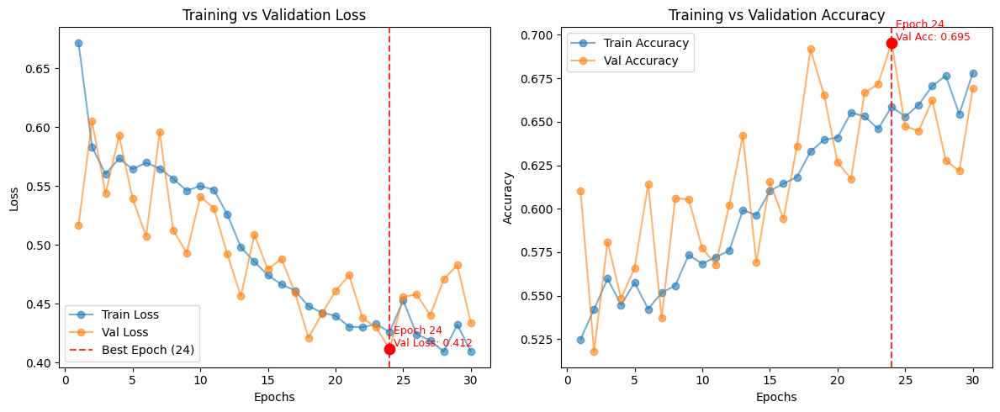

In [19]:
import matplotlib.pyplot as plt
import numpy as np

def plot_history(history):
    epochs = np.arange(1, len(history["train_loss"]) + 1)

    # Find the best epoch (lowest val loss)
    best_epoch = np.argmin(history["val_loss"]) + 1
    best_val_loss = history["val_loss"][best_epoch - 1]
    best_val_acc = history["val_acc"][best_epoch - 1]

    plt.figure(figsize=(12, 5))

    # -----------------------------
    # Plot Loss
    # -----------------------------
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="Train Loss", marker='o', alpha=0.6)
    plt.plot(epochs, history["val_loss"], label="Val Loss", marker='o', alpha=0.6)
    plt.axvline(best_epoch, color="red", linestyle="--", alpha=0.8, label=f"Best Epoch ({best_epoch})")
    plt.scatter(best_epoch, best_val_loss, color="red", s=80, zorder=5)
    plt.text(best_epoch + 0.3, best_val_loss, f"Epoch {best_epoch}\nVal Loss: {best_val_loss:.3f}",
             color="red", fontsize=9, verticalalignment="bottom")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title("Training vs Validation Loss")
    plt.legend()

    # -----------------------------
    # Plot Accuracy
    # -----------------------------
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="Train Accuracy", marker='o', alpha=0.6)
    plt.plot(epochs, history["val_acc"], label="Val Accuracy", marker='o', alpha=0.6)
    plt.axvline(best_epoch, color="red", linestyle="--", alpha=0.8)
    plt.scatter(best_epoch, best_val_acc, color="red", s=80, zorder=5)
    plt.text(best_epoch + 0.3, best_val_acc, f"Epoch {best_epoch}\nVal Acc: {best_val_acc:.3f}",
             color="red", fontsize=9, verticalalignment="bottom")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.title("Training vs Validation Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()
plot_history(history)


### 4.7 seventh experiment

In [20]:
# Parameters
root = "/content/one-short-learning/data"  # folder where CIFAR100 will be downloaded
num_training_classes = 90
pos_num_pairs = 50
neg_num_pairs = 50
batch_size = 64
img_size = 224

# Prepare data
train_loader, valid_loader, support_loader, query_loader = prepare_data(
    root=root,
    num_training_classes=num_training_classes,
    pos_num_pairs=pos_num_pairs,
    neg_num_pairs=neg_num_pairs,
    batch_size=batch_size,
    img_size=img_size

)


[INFO] Full dataset size: 60000
[INFO] Seen dataset size: 54000
[INFO] Unseen dataset size: 6000
[INFO] Test dataset (unseen classes) size: 6000
[INFO] Total pairs generated for training: 9000
[INFO] Number of batches - Train: 127, Validation: 15
Support: torch.Size([10, 3, 224, 224]) torch.Size([10])
Query: torch.Size([5990, 3, 224, 224]) torch.Size([5990])


In [21]:
net = SiameseResNet(embedding_size=128).to(device)

In [24]:
%%time
optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = torch.nn.BCEWithLogitsLoss()


epochs = 100
history, best_model = train(
    model=net,
    train_loader=train_loader,
    valid_loader=valid_loader,
    optimizer=optimizer,
    loss_fn=criterion,
    device=device,
    epochs=epochs,
    patience=20,
    writer=None
)

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch [1/100] --> Train Loss: 0.6975, Train Acc: 0.5219 | Val Loss: 0.6824, Val Acc: 0.5500
  ✅ New best model saved
Epoch [2/100] --> Train Loss: 0.6814, Train Acc: 0.5572 | Val Loss: 0.6862, Val Acc: 0.4878
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [3/100] --> Train Loss: 0.6703, Train Acc: 0.5812 | Val Loss: 0.6749, Val Acc: 0.5122
  ✅ New best model saved
Epoch [4/100] --> Train Loss: 0.6655, Train Acc: 0.5919 | Val Loss: 0.6593, Val Acc: 0.5633
  ✅ New best model saved
Epoch [5/100] --> Train Loss: 0.6566, Train Acc: 0.6022 | Val Loss: 0.6686, Val Acc: 0.5367
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [6/100] --> Train Loss: 0.6484, Train Acc: 0.6170 | Val Loss: 0.6564, Val Acc: 0.5633
  ✅ New best model saved
Epoch [7/100] --> Train Loss: 0.6398, Train Acc: 0.6337 | Val Loss: 0.6854, Val Acc: 0.5311
  ⚠️ No improvement. Early stop counter: 1/20
Epoch [8/100] --> Train Loss: 0.6423, Train Acc: 0.6312 | Val Loss: 0.6505, Val Acc: 0.5733
  ✅ New best model saved
E

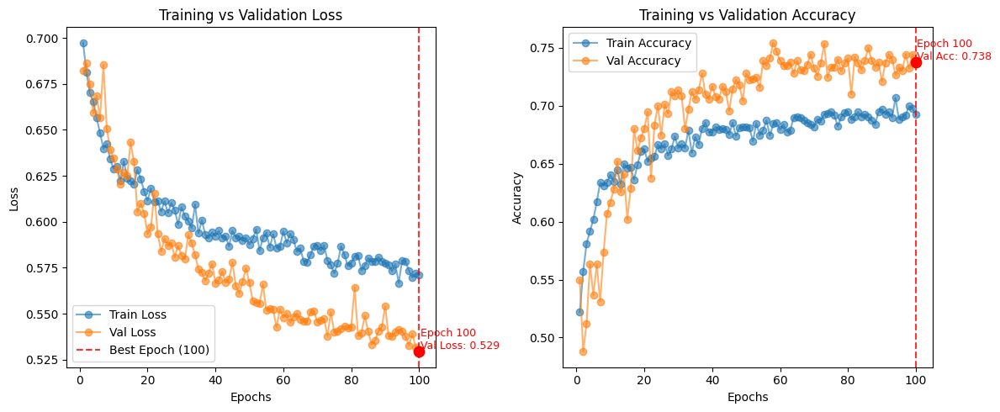

In [25]:
plot_history(history)


In [26]:
acc = evaluate_fewshot(net, support_loader, query_loader, device="cuda", batch_size=2048)


[RESULT] Few-shot accuracy: 0.2957


### 4.8 8 experiment